[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/x1ew/Analyzing-human-metaphase-II-oocyte-images/blob/main/Ooctye.ipynb)

#***Import Data***

In [ ]:
!pip install --upgrade --no-cache-dir gdown

  Attempting uninstall: gdown
    Found existing installation: gdown 4.6.6
    Uninstalling gdown-4.6.6:
      Successfully uninstalled gdown-4.6.6


In [ ]:
!gdown '1D-USEGbMH2B6IovLttMpkMwhtrz5Q0JP'
!unzip Data.zip

Streaming output truncated to the last 5000 lines.
  inflating: Dataset/Dataset/file (994)_p.png  
  inflating: Dataset/Dataset/file (994)_z.png  
  inflating: Dataset/Dataset/file (995).jpg  
  inflating: Dataset/Dataset/file (995)_multi.png  
  inflating: Dataset/Dataset/file (995)_o.png  
  inflating: Dataset/Dataset/file (995)_p.png  
  inflating: Dataset/Dataset/file (995)_z.png  
  inflating: Dataset/Dataset/file (996).jpg  
  inflating: Dataset/Dataset/file (996)_multi.png  
  inflating: Dataset/Dataset/file (996)_o.png  
  inflating: Dataset/Dataset/file (996)_p.png  
  inflating: Dataset/Dataset/file (996)_z.png  
  inflating: Dataset/Dataset/file (997).jpg  
  inflating: Dataset/Dataset/file (997)_multi.png  
  inflating: Dataset/Dataset/file (997)_o.png  
  inflating: Dataset/Dataset/file (997)_p.png  
  inflating: Dataset/Dataset/file (997)_z.png  
  inflating: Dataset/Dataset/file (998).jpg  
  inflating: Dataset/Dataset/file (998)_multi.png  
  inflating: Dataset/Dataset/

In [ ]:
!gdown '1hgLdWhVDkDfB7ZrUTglGZlmLlsK3gM2q'

Downloading...
From: https://drive.google.com/uc?id=1hgLdWhVDkDfB7ZrUTglGZlmLlsK3gM2q
To: /content/label_colors1.txt
100% 67.0/67.0 [00:00<00:00, 407kB/s]


In [ ]:
!ls

Dataset  Data.zip  label_colors1.txt  sample_data


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from os import listdir
from os.path import isfile, join

import torch
import torch.nn as nn
import torch.nn.functional as f
from torchvision.datasets import ImageFolder
from torchvision.transforms import functional as F
from torchvision import datasets, transforms, models
from torch.utils.data import Dataset, DataLoader
from torchsummary import summary
from torchvision.io import read_image
from sklearn.metrics import confusion_matrix, classification_report, precision_recall_fscore_support, ConfusionMatrixDisplay

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import torchvision.transforms as transforms


device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

#***Parameters***

In [ ]:
LR, EPS, WEIGHT_DECAY = 1e-4, 1e-08, 0.01
epochs = 10

#***Binary***

##***Data***

In [ ]:
def read_images(img_dir):
    file_list = [f for f in os.listdir(img_dir) if os.path.isfile(os.path.join(img_dir, f))]

    file_list = [f for f in os.listdir(img_dir) if os.path.isfile(os.path.join(img_dir, f))]
    frames_list = [file for file in file_list if ('_l' not in file.lower()) and ('txt' not in file) and file.lower().endswith('.jpg') or file.lower().endswith('.png') and ('_o' not in file) and ('_p' not in file) and ('_z' not in file) and ('_multi' not in file)]
    masks_list = [file for file in file_list if ('_o' in file.lower()) and ('txt' not in file)]


    frames_list.sort()
    masks_list.sort()

    print('{} frame files found in the provided directory.'.format(len(frames_list)))
    print('{} mask files found in the provided directory.'.format(len(masks_list)))
    frames_paths = [os.path.join(img_dir, fname) for fname in frames_list]
    masks_paths = [os.path.join(img_dir, fname) for fname in masks_list]

    print('Completed importing {} frame images from the provided directory.'.format(len(frames_list)))
    print('Completed importing {} mask images from the provided directory.'.format(len(masks_list)))

    return frames_paths, masks_paths

In [ ]:
img_dir = '/content/Dataset/Dataset'
frames_paths, masks_paths = read_images(img_dir)

1009 frame files found in the provided directory.
1009 mask files found in the provided directory.
Completed importing 1009 frame images from the provided directory.
Completed importing 1009 mask images from the provided directory.


In [ ]:
from sklearn.model_selection import train_test_split
frame_train, frame_valid, mask_train, mask_valid = train_test_split(frames_paths, masks_paths, test_size=0.40, random_state=42)
frame_valid, frame_test, mask_valid, mask_test = train_test_split(frame_valid, mask_valid, test_size=0.5, random_state=42)

In [ ]:
def parse_code(l):
    if len(l.strip().split("\t")) == 2:
        a, b = l.strip().split("\t")
        return tuple(int(i) for i in a.split(' ')), b
    else:
        a, b, c = l.strip().split("\t")
        return tuple(int(i) for i in a.split(' ')), c

In [ ]:
label_codes, label_names = zip(*[parse_code(l) for l in open("label_colors1.txt")])
label_codes, label_names = list(label_codes), list(label_names)
label_codes[:4], label_names[:4]

([(0, 0, 0), (255, 0, 0), (100, 0, 255), (255, 255, 255)],
 ['Avali', 'Dovomi', 'Sevomi', 'Background'])

In [ ]:
label_codes, label_names

([(0, 0, 0), (255, 0, 0), (100, 0, 255), (255, 255, 255)],
 ['Avali', 'Dovomi', 'Sevomi', 'Background'])

In [ ]:
code2id = {v:k for k,v in enumerate(label_codes)}
id2code = {k:v for k,v in enumerate(label_codes)}

In [ ]:
name2id = {v:k for k,v in enumerate(label_names)}
id2name = {k:v for k,v in enumerate(label_names)}

In [ ]:
id2code

{0: (0, 0, 0), 1: (255, 0, 0), 2: (100, 0, 255), 3: (255, 255, 255)}

In [ ]:
id2name

{0: 'Avali', 1: 'Dovomi', 2: 'Sevomi', 3: 'Background'}

In [ ]:
id2code = {
    0: [0, 0, 0],
    1: [255, 255, 255]
}

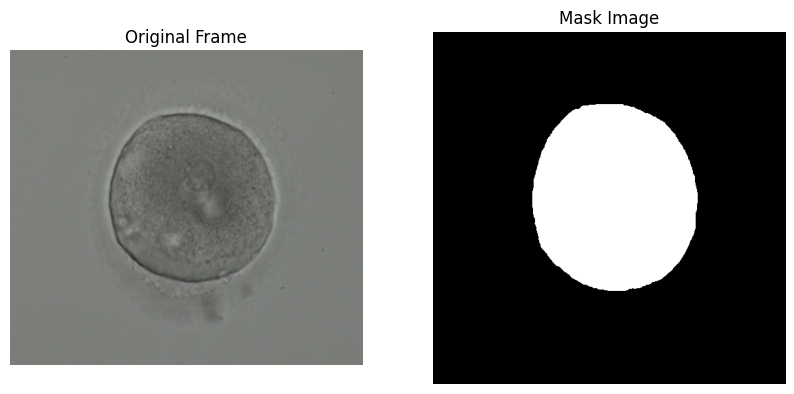

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

id2code = {
    0: [0, 0, 0],
    1: [255, 255, 255]
}

mask_path = '/content/Dataset/Dataset/file (1)_o.png'
mask = Image.open(mask_path).convert('RGB')
mask = mask.resize((512, 512))
mask_array = np.array(mask)

mask_rgb = np.zeros(mask_array.shape, dtype=np.uint8)
for class_id, rgb_color in id2code.items():
    mask_rgb[np.all(mask_array == rgb_color, axis=-1)] = rgb_color

frame_path = '/content/Dataset/Dataset/file (1).png'
frame = Image.open(frame_path).convert('RGB')

fig, arr = plt.subplots(1, 2, figsize=(10, 5))
arr[0].imshow(frame)
arr[0].set_title('Original Frame')
arr[0].axis('off')

arr[1].imshow(mask_rgb)
arr[1].set_title('Mask Image')
arr[1].axis('off')

plt.show()

In [ ]:
class OOCyte(torch.utils.data.Dataset):
    def __init__(self, dir_of, dir_om,  id2code, transform=None, output_height = 512, output_width = 512):
        self.id2code = id2code
        self.transform = transform

        self.output_height = output_height
        self.output_width = output_width

        self.frame = []
        self.mask = []

        for file in sorted(dir_of):
            img = Image.open(file)
            img_resized = img.resize((self.output_width, self.output_height), Image.BICUBIC)
            img_numpy = np.array(img_resized)
            transposi = np.transpose(img_numpy, (2, 0, 1))
            self.frame.append(torch.from_numpy(transposi).float())


        for file in sorted(dir_om):
            img_m = Image.open(file).convert("L")
            img_resized_m = img_m.resize((self.output_width, self.output_height), Image.BICUBIC)
            img_numpy_m = np.array(img_resized_m, dtype=np.float32)
            self.mask.append(torch.from_numpy(img_numpy_m))

    def __len__(self):
        return len(self.frame)

    def __getitem__(self, idx):
        of = self.frame[idx]
        om = self.mask[idx]
        if self.transform:
            of = self.transform(of)
        return of, om

In [ ]:
def loading_data_oocyte(batch_size, augmentation = None):
    train_transform = [transforms.Normalize(mean=[0.5, 0.5, 0.5],
                       std=[0.5, 0.5, 0.5])]

    valid_transform = [transforms.Normalize(mean=[0.5, 0.5, 0.5],
                       std=[0.5, 0.5, 0.5])]

    train_transform = transforms.Compose(train_transform)
    valid_transform = transforms.Compose(valid_transform)

    train_data = OOCyte(dir_of = frame_train,
                       dir_om = mask_train,
                       id2code = id2code,
                       transform = train_transform,
                       output_height=512,
                       output_width=512)

    valid_data = OOCyte(dir_of = frame_valid,
                       dir_om = mask_valid,
                       id2code = id2code,
                       transform = valid_transform,
                       output_height=512,
                       output_width=512)

    test_data = OOCyte(dir_of = frame_test,
                       dir_om = mask_test,
                       id2code = id2code,
                       output_height=512,
                       output_width=512)

    train_dataloader = torch.utils.data.DataLoader(
        train_data,
        batch_size=batch_size,
        shuffle=False,
    )
    valid_dataloader = torch.utils.data.DataLoader(
        valid_data,
        batch_size=batch_size,
        shuffle=False,
    )
    test_dataloader = torch.utils.data.DataLoader(
        test_data,
        batch_size=batch_size,
        shuffle=False,
    )
    return train_dataloader, valid_dataloader, test_dataloader

##***Model***

In [ ]:
import torch
import torch.nn as nn

class Conv2DBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, batchnorm=True):
        super(Conv2DBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size, padding=1)
        self.batchnorm1 = nn.BatchNorm2d(out_channels) if batchnorm else None
        self.relu1 = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size, padding=1)
        self.batchnorm2 = nn.BatchNorm2d(out_channels) if batchnorm else None
        self.relu2 = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.conv1(x)
        if self.batchnorm1:
            x = self.batchnorm1(x)
        x = self.relu1(x)

        x = self.conv2(x)
        if self.batchnorm2:
            x = self.batchnorm2(x)
        x = self.relu2(x)

        return x

In [ ]:
class UNet(nn.Module):
    def __init__(self, in_channels, n_classes, n_filters=16, dropout=0.05, batchnorm=True):
        super(UNet, self).__init__()
        self.c1 = Conv2DBlock(in_channels, n_filters, kernel_size=3, batchnorm=batchnorm)
        self.p1 = nn.MaxPool2d(2)
        self.p1_drop = nn.Dropout2d(dropout * 0.5)
        self.c2 = Conv2DBlock(n_filters, n_filters * 2, kernel_size=3, batchnorm=batchnorm)
        self.p2 = nn.MaxPool2d(2)
        self.p2_drop = nn.Dropout2d(dropout)
        self.c3 = Conv2DBlock(n_filters * 2, n_filters * 4, kernel_size=3, batchnorm=batchnorm)
        self.p3 = nn.MaxPool2d(2)
        self.p3_drop = nn.Dropout2d(dropout)
        self.c4 = Conv2DBlock(n_filters * 4, n_filters * 8, kernel_size=3, batchnorm=batchnorm)
        self.p4 = nn.MaxPool2d(2)
        self.p4_drop = nn.Dropout2d(dropout)
        self.c5 = Conv2DBlock(n_filters * 8, n_filters * 16, kernel_size=3, batchnorm=batchnorm)
        self.u6 = nn.ConvTranspose2d(n_filters * 16, n_filters * 8, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.u6_drop = nn.Dropout2d(dropout)
        self.c6 = Conv2DBlock(n_filters * 16, n_filters * 8, kernel_size=3, batchnorm=batchnorm)
        self.u7 = nn.ConvTranspose2d(n_filters * 8, n_filters * 4, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.u7_drop = nn.Dropout2d(dropout)
        self.c7 = Conv2DBlock(n_filters * 8, n_filters * 4, kernel_size=3, batchnorm=batchnorm)
        self.u8 = nn.ConvTranspose2d(n_filters * 4, n_filters * 2, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.u8_drop = nn.Dropout2d(dropout)
        self.c8 = Conv2DBlock(n_filters * 4, n_filters * 2, kernel_size=3, batchnorm=batchnorm)
        self.u9 = nn.ConvTranspose2d(n_filters * 2, n_filters, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.u9_drop = nn.Dropout2d(dropout)
        self.c9 = Conv2DBlock(n_filters * 2, n_filters, kernel_size=3, batchnorm=batchnorm)
        self.final_conv = nn.Conv2d(n_filters, n_classes, kernel_size=1)  # Output channels = n_classes
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        c1 = self.c1(x)
        p1 = self.p1(c1)
        p1 = self.p1_drop(p1)
        c2 = self.c2(p1)
        p2 = self.p2(c2)
        p2 = self.p2_drop(p2)
        c3 = self.c3(p2)
        p3 = self.p3(c3)
        p3 = self.p3_drop(p3)
        c4 = self.c4(p3)
        p4 = self.p4(c4)
        p4 = self.p4_drop(p4)
        c5 = self.c5(p4)
        u6 = self.u6(c5)
        u6 = torch.cat([u6, c4], dim=1)
        u6 = self.u6_drop(u6)
        c6 = self.c6(u6)
        u7 = self.u7(c6)
        u7 = torch.cat([u7, c3], dim=1)
        u7 = self.u7_drop(u7)
        c7 = self.c7(u7)
        u8 = self.u8(c7)
        u8 = torch.cat([u8, c2], dim=1)
        u8 = self.u8_drop(u8)
        c8 = self.c8(u8)
        u9 = self.u9(c8)
        u9 = torch.cat([u9, c1], dim=1)
        u9 = self.u9_drop(u9)
        c9 = self.c9(u9)
        out = self.final_conv(c9)
        out = self.sigmoid(out)
        return out

model = UNet(in_channels=3, n_classes=1, n_filters=16, dropout=0.05, batchnorm=True)

In [ ]:
model

UNet(
  (c1): Conv2DBlock(
    (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (batchnorm1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu1): ReLU(inplace=True)
    (conv2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (batchnorm2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu2): ReLU(inplace=True)
  )
  (p1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (p1_drop): Dropout2d(p=0.025, inplace=False)
  (c2): Conv2DBlock(
    (conv1): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (batchnorm1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu1): ReLU(inplace=True)
    (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (batchnorm2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu2): Re

In [ ]:
summary(model.to(device), (3, 512, 512))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 512, 512]             448
       BatchNorm2d-2         [-1, 16, 512, 512]              32
              ReLU-3         [-1, 16, 512, 512]               0
            Conv2d-4         [-1, 16, 512, 512]           2,320
       BatchNorm2d-5         [-1, 16, 512, 512]              32
              ReLU-6         [-1, 16, 512, 512]               0
       Conv2DBlock-7         [-1, 16, 512, 512]               0
         MaxPool2d-8         [-1, 16, 256, 256]               0
         Dropout2d-9         [-1, 16, 256, 256]               0
           Conv2d-10         [-1, 32, 256, 256]           4,640
      BatchNorm2d-11         [-1, 32, 256, 256]              64
             ReLU-12         [-1, 32, 256, 256]               0
           Conv2d-13         [-1, 32, 256, 256]           9,248
      BatchNorm2d-14         [-1, 32, 2

##***Utility Functions***

In [ ]:
def train(model, trainloader, criterion, optimizer):
    corrects = 0
    losses = []
    model.train()
    for frame, mask in trainloader:
        frame = frame.to(device)
        mask = mask.unsqueeze(1).to(device) / 255.0

        frame_normalized = (frame - frame.min()) / (frame.max() - frame.min())

        output = model(frame_normalized)

        pred = (output > 0.5).float()
        corrects += torch.sum(pred == mask)

        loss = criterion(output, mask)

        losses.append(loss)

        loss.backward()
        optimizer.step() #update weight
        optimizer.zero_grad()
    # print(sum(losses)/len(losses))

    return (corrects/(512*512*len(trainloader)*5)), (sum(losses)/len(losses))

In [ ]:
def validation(model, validloader, criterion):
    corrects = 0
    losses = []
    model.eval()
    with torch.no_grad():
        for frame, mask in validloader:
            frame = frame.to(device)
            mask = mask.unsqueeze(1).to(device) / 255.0

            frame_normalized = (frame - frame.min()) / (frame.max() - frame.min())

            output = model(frame_normalized)

            pred = (output > 0.5).float()
            corrects += torch.sum(pred == mask)

            loss = criterion(output, mask)
            losses.append(loss)
    # print(sum(losses)/len(losses))

    return (corrects/(512*512*len(validloader)*5)), (sum(losses)/len(losses))

In [ ]:
def fit(model, criterion, optimizer, EPOCHS):
    losses_train, losses_valid  ,acc_train, acc_valid = ([] for i in range(4))

    for e in range(EPOCHS):
        train_c, train_l = train(model, train_dataloader, criterion, optimizer)
        val_c, val_l = validation(model, valid_dataloader, criterion)
        losses_train.append(train_l)
        acc_train.append(train_c)

        losses_valid.append(val_l)
        acc_valid.append(val_c)

        print(f"Epoch {e + 1} -- train accuracy {train_c * 100:.3f} -- train losses {train_l:.3f} -- valid accuracy {val_c * 100:.3f} -- valid losses {val_l:.3f}")

    return losses_train, losses_valid, acc_train , acc_valid

In [ ]:
def plotplz(filename=None):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))

    acc_train_np = np.array([tensor.detach().cpu().numpy() for tensor in acc_train])
    acc_valid_np = np.array([tensor.detach().cpu().numpy() for tensor in acc_valid])
    losses_train_np = np.array([tensor.detach().cpu().numpy() for tensor in losses_train])
    losses_valid_np = np.array([tensor.detach().cpu().numpy() for tensor in losses_valid])

    ax1.plot(acc_train_np, label="Train Accuracy")
    ax1.plot(acc_valid_np, label="Validation Accuracy")
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel("Accuracy (%)")
    ax1.legend()

    ax2.plot(losses_train_np, label="Train Loss")
    ax2.plot(losses_valid_np, label="Validation Loss")
    ax2.set_xlabel("Epochs")
    ax2.set_ylabel("Loss")
    ax2.legend()

    plt.tight_layout()
    plt.show()

##***Training***

In [ ]:
train_dataloader, valid_dataloader, test_dataloader= loading_data_oocyte(batch_size = 5, augmentation = True)
model = model.to(device)
criterion = nn.BCELoss().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=LR, eps=EPS, weight_decay=WEIGHT_DECAY)
losses_train, losses_valid, acc_train , acc_valid = fit(model, criterion, optimizer, epochs)

Epoch 1 -- train accuracy 94.732 -- train losses 0.422 -- valid accuracy 93.858 -- valid losses 0.381
Epoch 2 -- train accuracy 97.421 -- train losses 0.330 -- valid accuracy 93.178 -- valid losses 0.355
Epoch 3 -- train accuracy 97.898 -- train losses 0.298 -- valid accuracy 94.749 -- valid losses 0.315
Epoch 4 -- train accuracy 98.160 -- train losses 0.271 -- valid accuracy 95.069 -- valid losses 0.288
Epoch 5 -- train accuracy 98.296 -- train losses 0.250 -- valid accuracy 95.761 -- valid losses 0.264
Epoch 6 -- train accuracy 98.376 -- train losses 0.231 -- valid accuracy 95.611 -- valid losses 0.250
Epoch 7 -- train accuracy 98.615 -- train losses 0.211 -- valid accuracy 94.676 -- valid losses 0.250
Epoch 8 -- train accuracy 98.694 -- train losses 0.195 -- valid accuracy 96.469 -- valid losses 0.214
Epoch 9 -- train accuracy 98.651 -- train losses 0.182 -- valid accuracy 95.182 -- valid losses 0.218
Epoch 10 -- train accuracy 98.618 -- train losses 0.169 -- valid accuracy 96.382 -

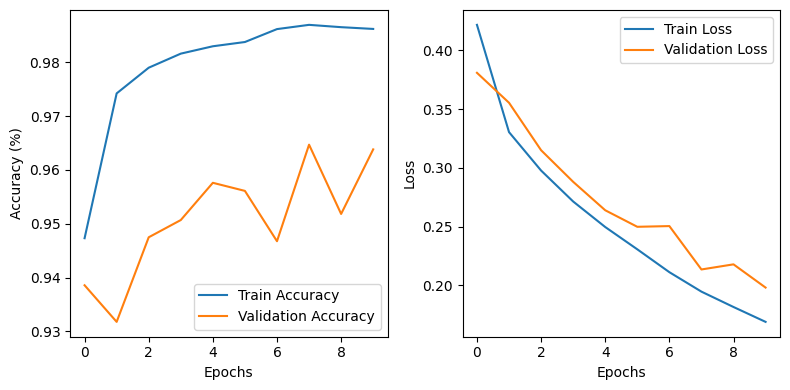

In [ ]:
plotplz()

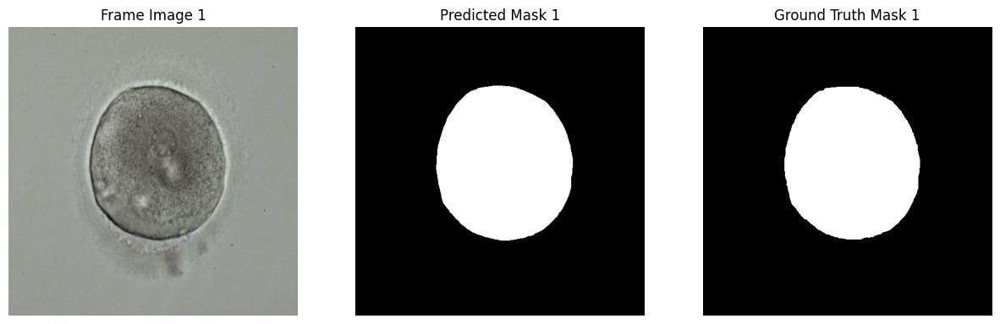

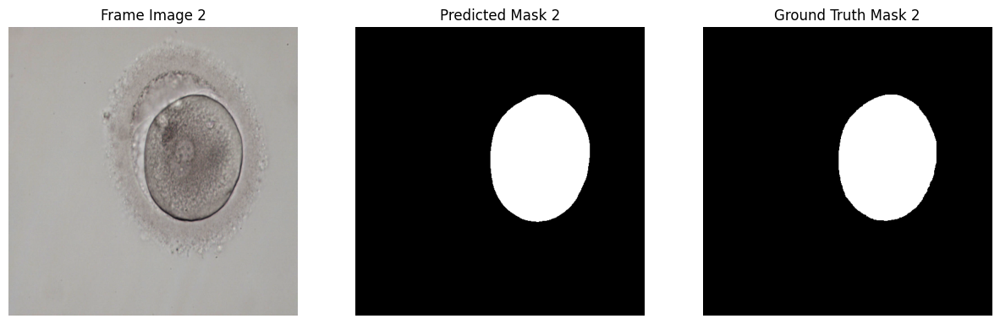

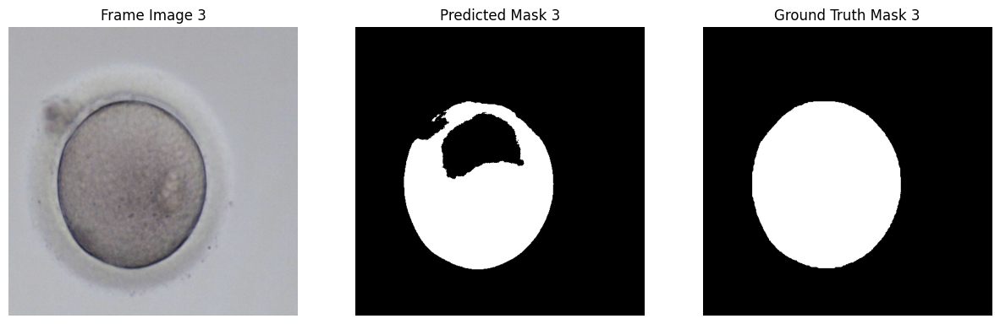

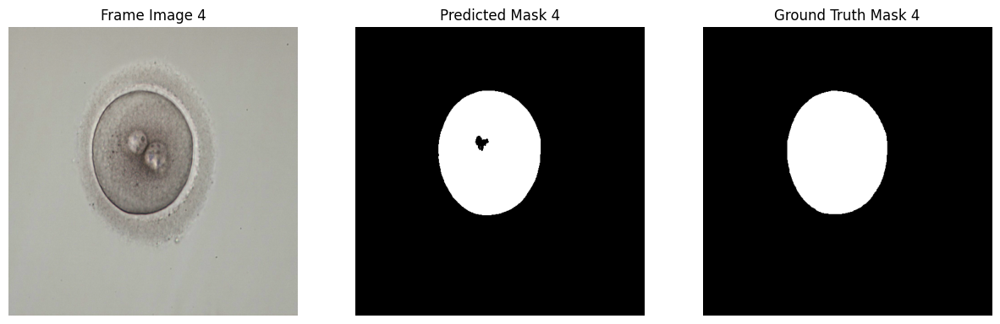

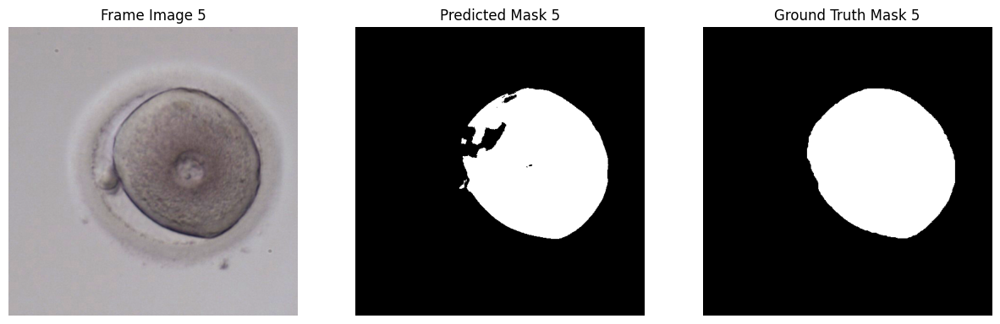

...

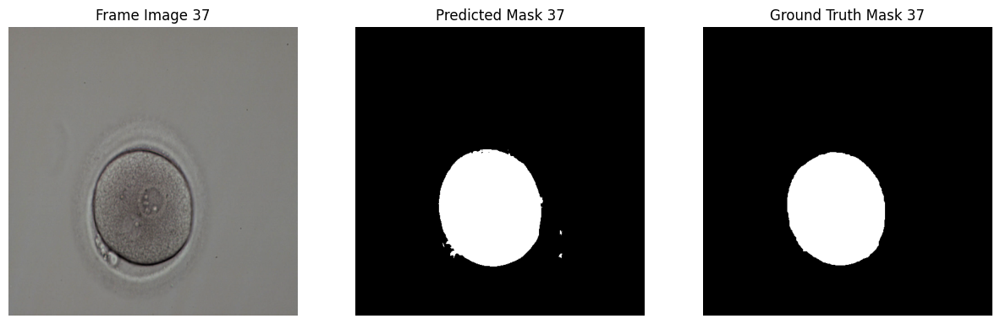

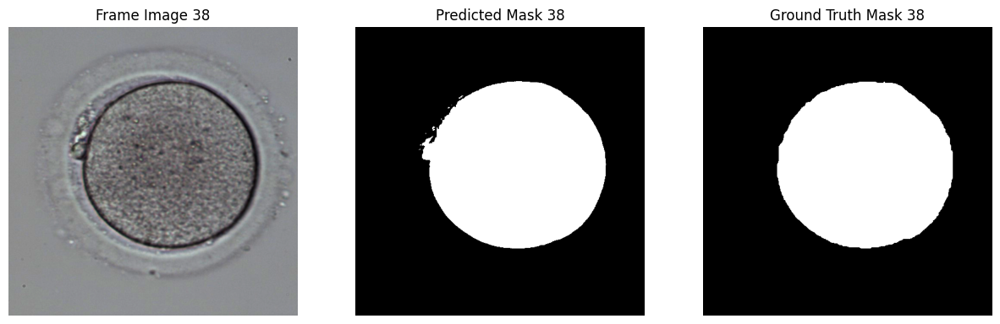

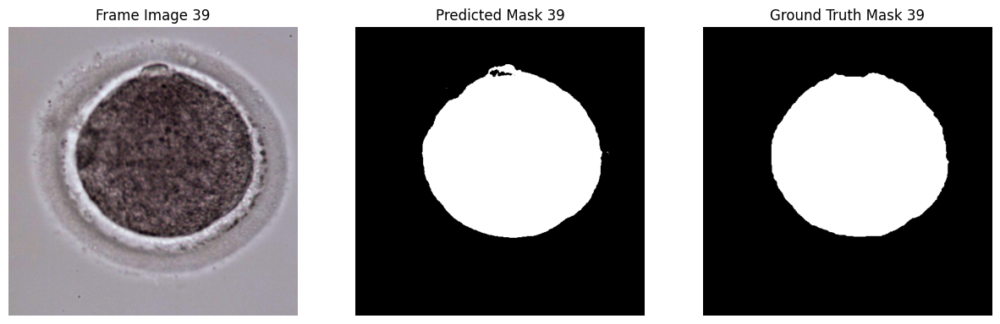

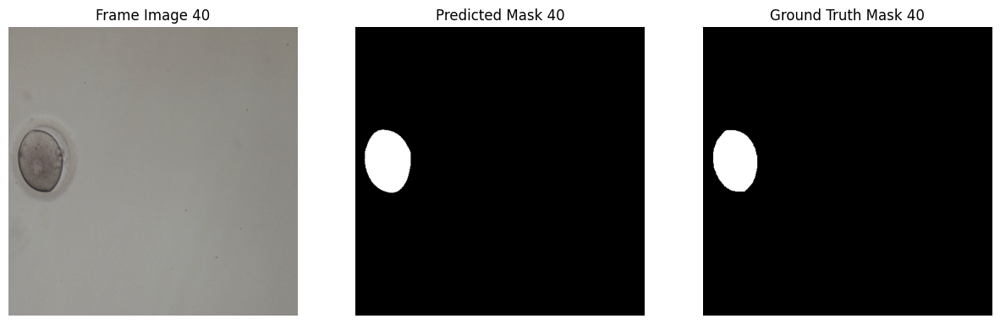

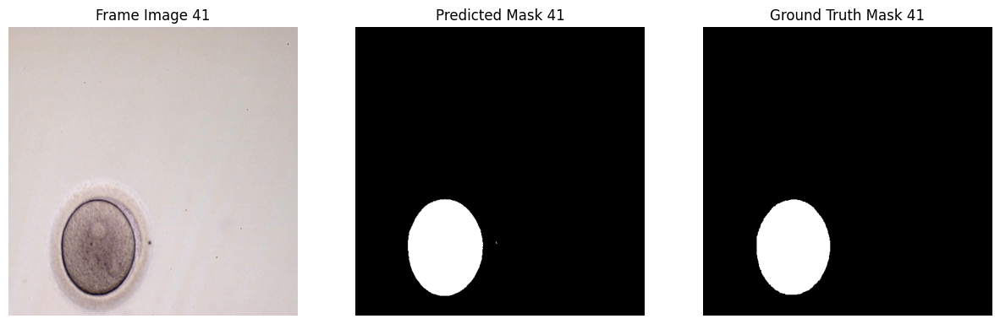

In [ ]:
id2code = {
    0: [0, 0, 0],
    1: [255, 255, 255]
}

model.eval()
with torch.no_grad():
    for i, (frame, mask) in enumerate(valid_dataloader):
        frame = frame.to(device)
        mask = mask.unsqueeze(1).to(device) / 255.0

        frame_normalized = (frame - frame.min()) / (frame.max() - frame.min())

        output = model(frame_normalized)

        frame_np = frame_normalized.cpu().numpy()
        pred_val_np = (output.cpu().numpy() > 0.5)
        mask_np = mask.cpu().numpy()

        frame_np = frame_np[0].transpose(1, 2, 0)
        pred_val_np = pred_val_np[0, 0]
        mask_np = mask_np[0, 0]

        mask_rgb = np.zeros((mask_np.shape[0], mask_np.shape[1], 3), dtype=np.uint8)
        for class_id, rgb_color in id2code.items():
            mask_rgb[np.where(mask_np == class_id)] = rgb_color

        plt.figure(figsize=(15, 5))

        plt.subplot(1, 3, 1)
        plt.imshow(frame_np)
        plt.title(f"Frame Image {i+1}")
        plt.axis("off")

        plt.subplot(1, 3, 2)
        plt.imshow(pred_val_np, cmap="gray")
        plt.title(f"Predicted Mask {i+1}")
        plt.axis("off")

        plt.subplot(1, 3, 3)
        plt.imshow(mask_rgb)
        plt.title(f"Ground Truth Mask {i+1}")
        plt.axis("off")

        plt.show()

#***Multiclass***

###***Data***

In [ ]:
import torch
import random
import numpy as np

seed = 1

torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [ ]:
def read_images(img_dir):
    file_list = [f for f in os.listdir(img_dir) if os.path.isfile(os.path.join(img_dir, f))]

    file_list = [f for f in os.listdir(img_dir) if os.path.isfile(os.path.join(img_dir, f))]
    frames_list = [file for file in file_list if ('_l' not in file.lower()) and ('txt' not in file) and file.lower().endswith('.jpg') or file.lower().endswith('.png') and ('_o' not in file) and ('_p' not in file) and ('_z' not in file) and ('_multi' not in file)]
    masks_list = [file for file in file_list if ('_multi' in file.lower()) and ('txt' not in file)]

    frames_list.sort()
    masks_list.sort()

    print('{} frame files found in the provided directory.'.format(len(frames_list)))
    print('{} mask files found in the provided directory.'.format(len(masks_list)))
    frames_paths = [os.path.join(img_dir, fname) for fname in frames_list]
    masks_paths = [os.path.join(img_dir, fname) for fname in masks_list]

    print('Completed importing {} frame images from the provided directory.'.format(len(frames_list)))
    print('Completed importing {} mask images from the provided directory.'.format(len(masks_list)))

    return frames_paths, masks_paths

In [ ]:
img_dir = '/content/Dataset/Dataset'
frames_paths, masks_paths = read_images(img_dir)

1009 frame files found in the provided directory.
1009 mask files found in the provided directory.
Completed importing 1009 frame images from the provided directory.
Completed importing 1009 mask images from the provided directory.


In [ ]:
from sklearn.model_selection import train_test_split
frame_train, frame_valid, mask_train, mask_valid = train_test_split(frames_paths, masks_paths, test_size=0.40, random_state=42)
frame_valid, frame_test, mask_valid, mask_test = train_test_split(frame_valid, mask_valid, test_size=0.5, random_state=42)

In [ ]:
def parse_code(l):
    if len(l.strip().split("\t")) == 2:
        a, b = l.strip().split("\t")
        return tuple(int(i) for i in a.split(' ')), b
    else:
        a, b, c = l.strip().split("\t")
        return tuple(int(i) for i in a.split(' ')), c

In [ ]:
label_codes, label_names = zip(*[parse_code(l) for l in open("label_colors1.txt")])
label_codes, label_names = list(label_codes), list(label_names)
label_codes[:4], label_names[:4]

([(0, 0, 0), (255, 0, 0), (100, 0, 255), (255, 255, 255)],
 ['Avali', 'Dovomi', 'Sevomi', 'Background'])

In [ ]:
label_codes, label_names

([(0, 0, 0), (255, 0, 0), (100, 0, 255), (255, 255, 255)],
 ['Avali', 'Dovomi', 'Sevomi', 'Background'])

In [ ]:
code2id = {v:k for k,v in enumerate(label_codes)}
id2code = {k:v for k,v in enumerate(label_codes)}

In [ ]:
name2id = {v:k for k,v in enumerate(label_names)}
id2name = {k:v for k,v in enumerate(label_names)}

In [ ]:
id2code

{0: (0, 0, 0), 1: (255, 0, 0), 2: (100, 0, 255), 3: (255, 255, 255)}

In [ ]:
id2name

{0: 'Avali', 1: 'Dovomi', 2: 'Sevomi', 3: 'Background'}

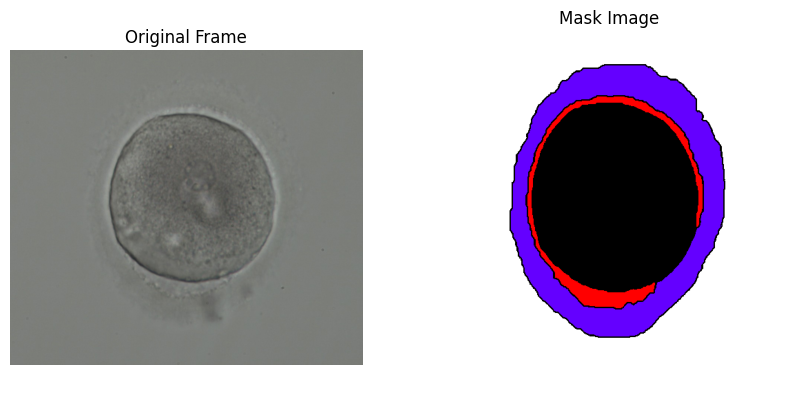

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

mask_path = '/content/Dataset/Dataset/file (1)_multi.png'
mask = Image.open(mask_path).convert('RGB')
mask = mask.resize((512, 512))
mask_array = np.array(mask)

colormap = {
    0: (0, 0, 0),
    1: (255, 0, 0),
    2: (100, 0, 255),
    3: (255, 255, 255)
}

mask_rgb = np.zeros(mask_array.shape)
for class_id, rgb_color in colormap.items():
    mask_rgb[np.all(mask_array == rgb_color, axis=-1)] = rgb_color

frame_path = '/content/Dataset/Dataset/file (1).png'
frame = Image.open(frame_path).convert('RGB')

fig, arr = plt.subplots(1, 2, figsize=(10, 5))
arr[0].imshow(frame)
arr[0].set_title('Original Frame')
arr[0].axis('off')

arr[1].imshow(mask_rgb.astype(np.uint8))
arr[1].set_title('Mask Image')
arr[1].axis('off')

plt.show()

In [ ]:
id2code = {
    0: [0, 0, 0],
    1: [255, 0, 0],
    2: [100, 0, 255],
    3: [255, 255, 255]
}

In [ ]:
def rgb_to_onehot(rgb_image, colormap = id2code):
    num_classes = len(colormap)
    shape = rgb_image.shape[:2]+(num_classes,) # (512, 512, 4)
    encoded_image = np.zeros(shape, dtype=np.int8) # (512, 512, 4)
    for i, cls in enumerate(colormap): #i = 0,1,2,3 cls = 0, 1, 2, 3
        encoded_image[:,:,i] = np.all(rgb_image.reshape((-1,3)) == colormap[i], axis=1).reshape(shape[:2])
    return encoded_image

In [ ]:
class OOCyte(torch.utils.data.Dataset):
    def __init__(self, dir_of, dir_om,  id2code, transform=None, output_height = 512, output_width = 512):
        self.id2code = id2code
        self.transform = transform

        self.output_height = output_height
        self.output_width = output_width

        self.frame = []
        self.mask = []

        for file in sorted(dir_of):
            img = Image.open(file).convert("RGB")
            img_resized = img.resize((self.output_width, self.output_height), Image.BICUBIC)
            img_numpy = np.array(img_resized)
            transposi = np.transpose(img_numpy, (2, 0, 1))
            self.frame.append(torch.from_numpy(transposi.astype(np.float32)))


        for file in sorted(dir_om):
            img_m = Image.open(file).convert("RGB")
            img_resized_m = img_m.resize((self.output_width, self.output_height), Image.BICUBIC)
            img_numpy_m = np.array(img_resized_m)
            mask_encoded = rgb_to_onehot(img_numpy_m, self.id2code)
            transposi = np.transpose(mask_encoded, (2, 0, 1))
            self.mask.append(torch.from_numpy(transposi))


    def __len__(self):
        return len(self.frame)

    def __getitem__(self, idx):
        of = self.frame[idx]
        om = self.mask[idx]

        if self.transform:
            of = self.transform(of)
        return of, om

In [ ]:
def loading_data_oocyte(batch_size, augmentation = None):

    train_transform = [transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])]

    valid_transform = [transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])]

    train_transform = transforms.Compose(train_transform)
    valid_transform = transforms.Compose(valid_transform)

    train_data = OOCyte(dir_of = frame_train,
                       dir_om = mask_train,
                       id2code = id2code,
                       transform = train_transform,
                       output_height=512,
                       output_width=512)

    valid_data = OOCyte(dir_of = frame_valid,
                       dir_om = mask_valid,
                       id2code = id2code,
                       transform = valid_transform,
                       output_height=512,
                       output_width=512)

    test_data = OOCyte(dir_of = frame_test,
                       dir_om = mask_test,
                       id2code = id2code,
                       output_height=512,
                       output_width=512)

    train_dataloader = torch.utils.data.DataLoader(
        train_data,
        batch_size=batch_size,
        shuffle=False,
    )
    valid_dataloader = torch.utils.data.DataLoader(
        valid_data,
        batch_size=batch_size,
        shuffle=False,
    )
    test_dataloader = torch.utils.data.DataLoader(
        test_data,
        batch_size=batch_size,
        shuffle=False,
    )
    return train_dataloader, valid_dataloader, test_dataloader

###***Model***

In [ ]:
import torch
import torch.nn as nn

class Conv2DBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, batchnorm=True):
        super(Conv2DBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size, padding=1)
        self.batchnorm1 = nn.BatchNorm2d(out_channels) if batchnorm else None
        self.relu1 = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size, padding=1)
        self.batchnorm2 = nn.BatchNorm2d(out_channels) if batchnorm else None
        self.relu2 = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.conv1(x)
        if self.batchnorm1:
            x = self.batchnorm1(x)
        x = self.relu1(x)

        x = self.conv2(x)
        if self.batchnorm2:
            x = self.batchnorm2(x)
        x = self.relu2(x)

        return x

In [ ]:
class UNet(nn.Module):
    def __init__(self, in_channels, n_classes, n_filters=16, dropout=0.05, batchnorm=True):
        super(UNet, self).__init__()
        self.c1 = Conv2DBlock(in_channels, n_filters, kernel_size=3, batchnorm=batchnorm)
        self.p1 = nn.MaxPool2d(2)
        self.p1_drop = nn.Dropout2d(dropout * 0.5)
        self.c2 = Conv2DBlock(n_filters, n_filters * 2, kernel_size=3, batchnorm=batchnorm)
        self.p2 = nn.MaxPool2d(2)
        self.p2_drop = nn.Dropout2d(dropout)
        self.c3 = Conv2DBlock(n_filters * 2, n_filters * 4, kernel_size=3, batchnorm=batchnorm)
        self.p3 = nn.MaxPool2d(2)
        self.p3_drop = nn.Dropout2d(dropout)
        self.c4 = Conv2DBlock(n_filters * 4, n_filters * 8, kernel_size=3, batchnorm=batchnorm)
        self.p4 = nn.MaxPool2d(2)
        self.p4_drop = nn.Dropout2d(dropout)
        self.c5 = Conv2DBlock(n_filters * 8, n_filters * 16, kernel_size=3, batchnorm=batchnorm)
        self.u6 = nn.ConvTranspose2d(n_filters * 16, n_filters * 8, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.u6_drop = nn.Dropout2d(dropout)
        self.c6 = Conv2DBlock(n_filters * 16, n_filters * 8, kernel_size=3, batchnorm=batchnorm)
        self.u7 = nn.ConvTranspose2d(n_filters * 8, n_filters * 4, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.u7_drop = nn.Dropout2d(dropout)
        self.c7 = Conv2DBlock(n_filters * 8, n_filters * 4, kernel_size=3, batchnorm=batchnorm)
        self.u8 = nn.ConvTranspose2d(n_filters * 4, n_filters * 2, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.u8_drop = nn.Dropout2d(dropout)
        self.c8 = Conv2DBlock(n_filters * 4, n_filters * 2, kernel_size=3, batchnorm=batchnorm)
        self.u9 = nn.ConvTranspose2d(n_filters * 2, n_filters, kernel_size=3, stride=2, padding=1, output_padding=1)
        self.u9_drop = nn.Dropout2d(dropout)
        self.c9 = Conv2DBlock(n_filters * 2, n_filters, kernel_size=3, batchnorm=batchnorm)
        self.final_conv = nn.Conv2d(n_filters, n_classes, kernel_size=1)  # Output channels = n_classes
        self.softmax = nn.Softmax(dim=1)

    def forward(self, x):
        c1 = self.c1(x)
        p1 = self.p1(c1)
        p1 = self.p1_drop(p1)
        c2 = self.c2(p1)
        p2 = self.p2(c2)
        p2 = self.p2_drop(p2)
        c3 = self.c3(p2)
        p3 = self.p3(c3)
        p3 = self.p3_drop(p3)
        c4 = self.c4(p3)
        p4 = self.p4(c4)
        p4 = self.p4_drop(p4)
        c5 = self.c5(p4)
        u6 = self.u6(c5)
        u6 = torch.cat([u6, c4], dim=1)
        u6 = self.u6_drop(u6)
        c6 = self.c6(u6)
        u7 = self.u7(c6)
        u7 = torch.cat([u7, c3], dim=1)
        u7 = self.u7_drop(u7)
        c7 = self.c7(u7)
        u8 = self.u8(c7)
        u8 = torch.cat([u8, c2], dim=1)
        u8 = self.u8_drop(u8)
        c8 = self.c8(u8)
        u9 = self.u9(c8)
        u9 = torch.cat([u9, c1], dim=1)
        u9 = self.u9_drop(u9)
        c9 = self.c9(u9)
        out = self.final_conv(c9)
        out = self.softmax(out)
        return out

model = UNet(in_channels=3, n_classes=4, n_filters=16, dropout=0.05, batchnorm=True)

In [ ]:
model

UNet(
  (c1): Conv2DBlock(
    (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (batchnorm1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu1): ReLU(inplace=True)
    (conv2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (batchnorm2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu2): ReLU(inplace=True)
  )
  (p1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (p1_drop): Dropout2d(p=0.025, inplace=False)
  (c2): Conv2DBlock(
    (conv1): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (batchnorm1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu1): ReLU(inplace=True)
    (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (batchnorm2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu2): Re

In [ ]:
summary(model.to(device), (3, 512, 512))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 512, 512]             448
       BatchNorm2d-2         [-1, 16, 512, 512]              32
              ReLU-3         [-1, 16, 512, 512]               0
            Conv2d-4         [-1, 16, 512, 512]           2,320
       BatchNorm2d-5         [-1, 16, 512, 512]              32
              ReLU-6         [-1, 16, 512, 512]               0
       Conv2DBlock-7         [-1, 16, 512, 512]               0
         MaxPool2d-8         [-1, 16, 256, 256]               0
         Dropout2d-9         [-1, 16, 256, 256]               0
           Conv2d-10         [-1, 32, 256, 256]           4,640
      BatchNorm2d-11         [-1, 32, 256, 256]              64
             ReLU-12         [-1, 32, 256, 256]               0
           Conv2d-13         [-1, 32, 256, 256]           9,248
      BatchNorm2d-14         [-1, 32, 2

##***Utility Functions***

In [ ]:
def train(model, trainloader, criterion, optimizer):
    corrects = 0
    losses = []
    model.train()
    for frame, mask in trainloader:
        frame = frame.to(device)
        mask = mask.to(device)
        mask = mask / 1.0

        frame_normalized = (frame - frame.min()) / (frame.max() - frame.min())

        output = model(frame_normalized)

        pred = torch.argmax(output, dim = 1)
        lable = torch.argmax(mask, dim = 1)

        corrects += torch.sum(pred == lable)

        loss = criterion(output, mask)
        losses.append(loss)

        loss.backward()
        optimizer.step() #update weight
        optimizer.zero_grad()

    return (corrects/(512*512*len(trainloader)*5)), (sum(losses)/len(losses))

In [ ]:
def validation(model, validloader, criterion):
    corrects = 0
    losses = []
    model.eval()
    with torch.no_grad():
        for frame, mask in validloader:
            frame = frame.to(device)
            mask = mask.to(device)
            mask = mask / 1.0

            frame_normalized = (frame - frame.min()) / (frame.max() - frame.min())

            output = model(frame_normalized)

            pred = torch.argmax(output, dim = 1)
            lable = torch.argmax(mask, dim = 1)

            corrects += torch.sum(pred == lable)

            loss = criterion(output, mask)
            losses.append(loss)

    return (corrects/(512*512*len(validloader)*5)), (sum(losses)/len(losses))

In [ ]:
def fit(model, criterion, optimizer, EPOCHS):
    losses_train, losses_valid  ,acc_train, acc_valid = ([] for i in range(4))

    for e in range(EPOCHS):
        train_c, train_l = train(model, train_dataloader, criterion, optimizer)
        val_c, val_l = validation(model, valid_dataloader, criterion)
        losses_train.append(train_l)
        acc_train.append(train_c)

        losses_valid.append(val_l)
        acc_valid.append(val_c)

        print(f"Epoch {e + 1} -- train accuracy {train_c * 100:.3f} -- train losses {train_l:.3f} -- valid accuracy {val_c * 100:.3f} -- valid losses {val_l:.3f}")

    return losses_train, losses_valid, acc_train , acc_valid

In [ ]:
def plotplz(filename=None):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))

    acc_train_np = np.array([tensor.detach().cpu().numpy() for tensor in acc_train])
    acc_valid_np = np.array([tensor.detach().cpu().numpy() for tensor in acc_valid])
    losses_train_np = np.array([tensor.detach().cpu().numpy() for tensor in losses_train])
    losses_valid_np = np.array([tensor.detach().cpu().numpy() for tensor in losses_valid])

    ax1.plot(acc_train_np, label="Train Accuracy")
    ax1.plot(acc_valid_np, label="Validation Accuracy")
    ax1.set_xlabel("Epochs")
    ax1.set_ylabel("Accuracy (%)")
    ax1.legend()

    ax2.plot(losses_train_np, label="Train Loss")
    ax2.plot(losses_valid_np, label="Validation Loss")
    ax2.set_xlabel("Epochs")
    ax2.set_ylabel("Loss")
    ax2.legend()

    plt.tight_layout()
    plt.show()

##***Training***

In [ ]:
learning_rate = 0.0001
beta1 = 0.9
beta2 = 0.999
epsilon = 1e-8

In [ ]:
train_dataloader, valid_dataloader, test_dataloader= loading_data_oocyte(batch_size = 5, augmentation = True)
model = model.to(device)
criterion = nn.CrossEntropyLoss().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, betas=(beta1, beta2), eps=epsilon)
losses_train, losses_valid, acc_train , acc_valid = fit(model, criterion, optimizer, epochs)

Epoch 1 -- train accuracy 73.965 -- train losses 1.253 -- valid accuracy 76.134 -- valid losses 1.219
Epoch 2 -- train accuracy 86.732 -- train losses 1.177 -- valid accuracy 81.865 -- valid losses 1.189
Epoch 3 -- train accuracy 89.972 -- train losses 1.131 -- valid accuracy 87.952 -- valid losses 1.149
Epoch 4 -- train accuracy 90.919 -- train losses 1.095 -- valid accuracy 88.988 -- valid losses 1.124
Epoch 5 -- train accuracy 91.523 -- train losses 1.058 -- valid accuracy 87.583 -- valid losses 1.108
Epoch 6 -- train accuracy 91.948 -- train losses 1.024 -- valid accuracy 87.718 -- valid losses 1.082
Epoch 7 -- train accuracy 92.595 -- train losses 0.994 -- valid accuracy 87.967 -- valid losses 1.050
Epoch 8 -- train accuracy 93.255 -- train losses 0.966 -- valid accuracy 90.466 -- valid losses 1.027
Epoch 9 -- train accuracy 93.984 -- train losses 0.940 -- valid accuracy 92.002 -- valid losses 0.995
Epoch 10 -- train accuracy 94.348 -- train losses 0.917 -- valid accuracy 92.013 -

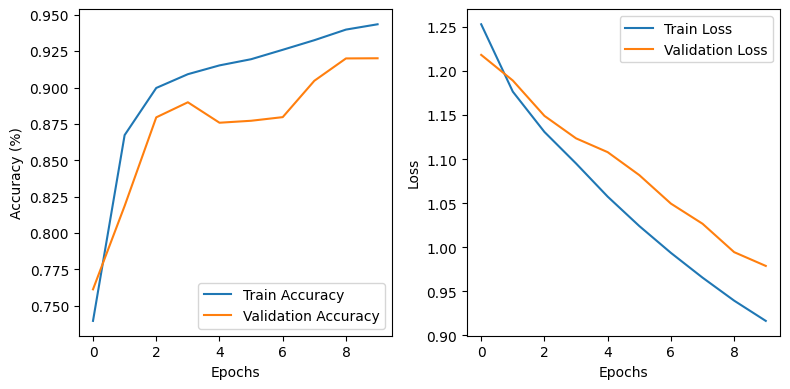

In [ ]:
plotplz()

In [ ]:
def onehot_to_rgb(onehot, colormap=id2code):
    single_layer = np.argmax(onehot, axis=-1)
    output = np.zeros(onehot.shape[:2] + (3,))
    for k in colormap.keys():
        output[single_layer == k] = colormap[k]
    return np.uint8(output)

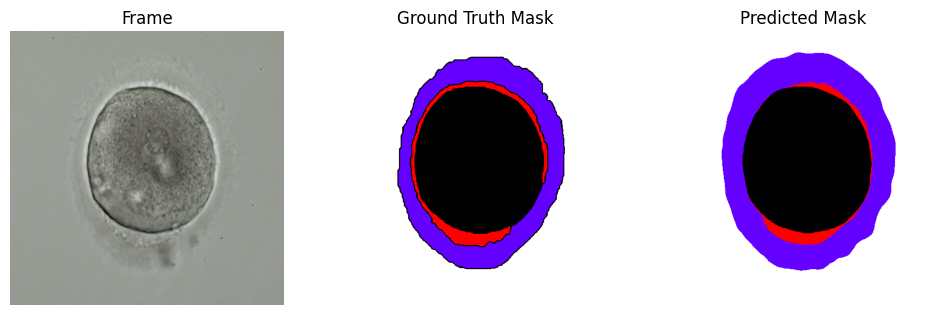

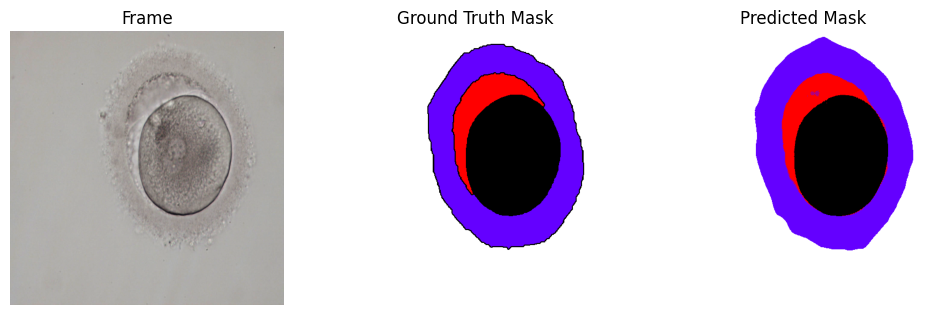

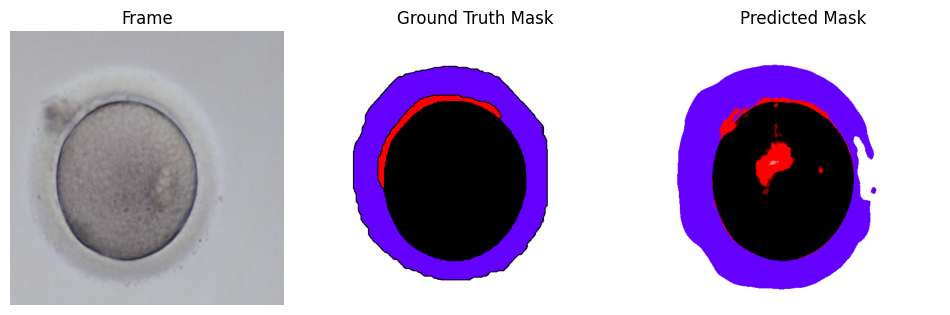

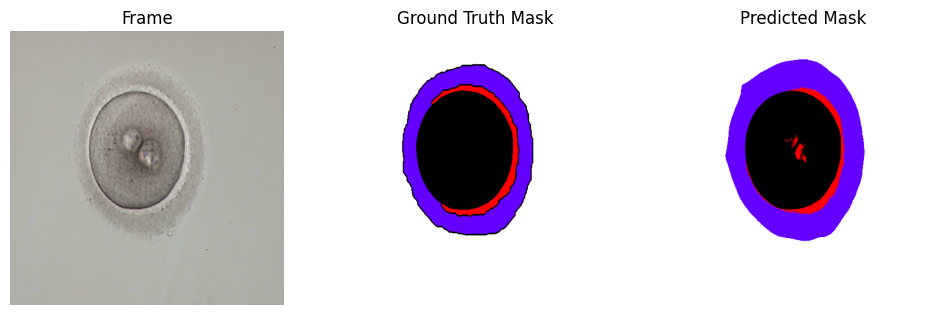

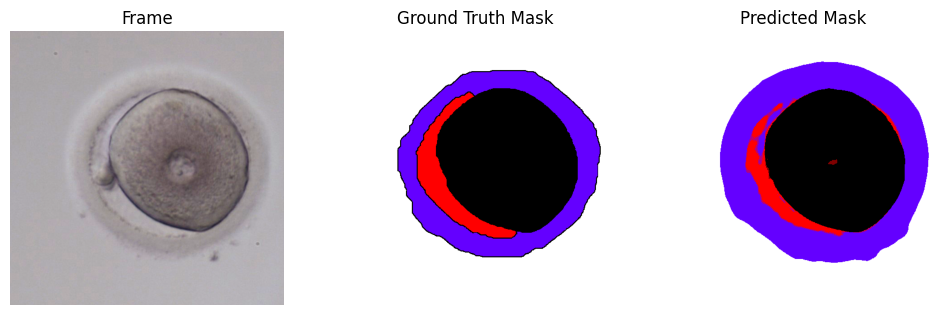

...

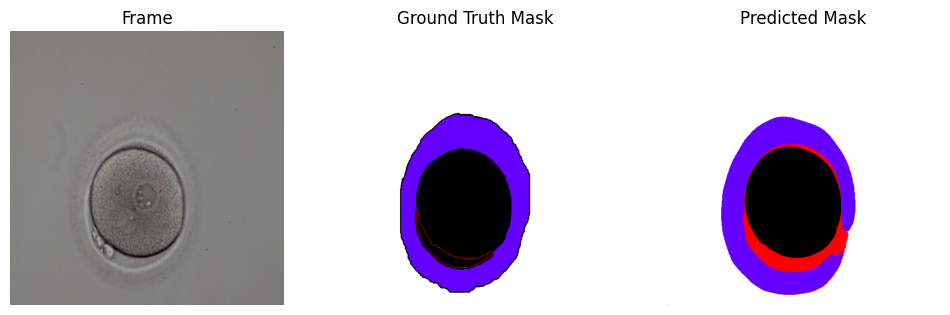

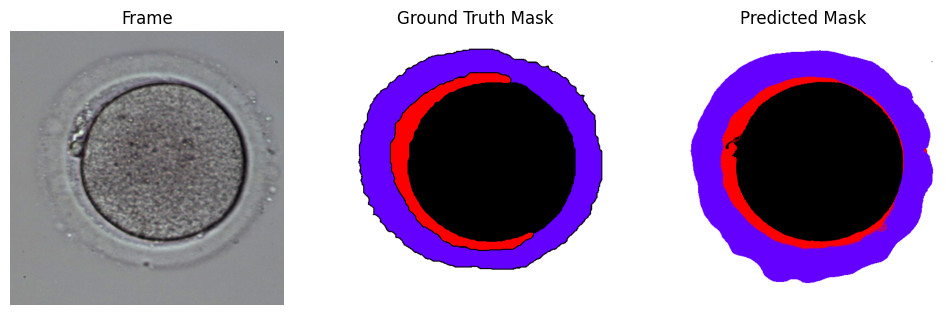

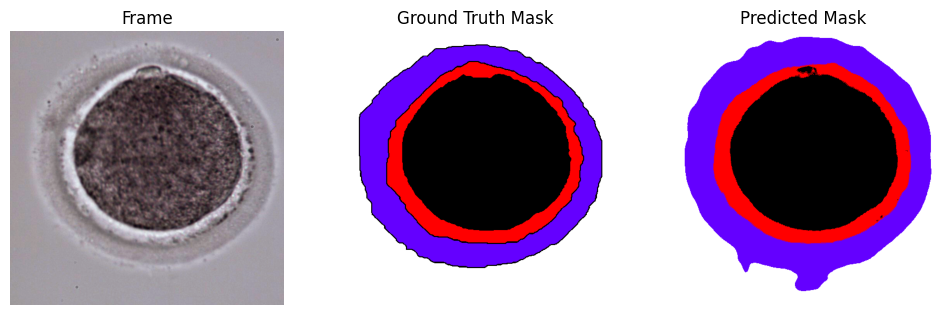

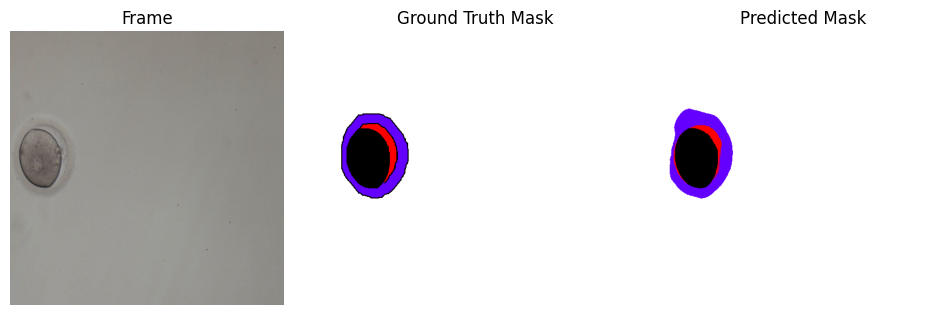

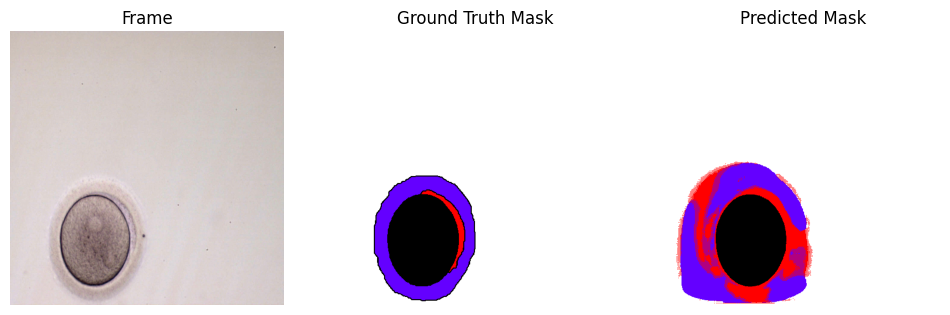

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

model.eval()
with torch.no_grad():
  for frame, mask in valid_dataloader:
    frame = frame.to(device)
    # frame = frame / 255.0
    mask = mask.to(device)
    mask = mask / 1.0

    frame_normalized = (frame - frame.min()) / (frame.max() - frame.min())

    output = model(frame_normalized)

    frame_example_np = frame_normalized[0].cpu().detach().numpy().transpose((1, 2, 0))
    mask_example_np = mask[0].cpu().detach().numpy().transpose((1, 2, 0))
    predicted_mask_example_np = output[0].cpu().detach().numpy().transpose((1, 2, 0))

    mask_example_rgb = onehot_to_rgb(mask_example_np, colormap)
    predicted_mask_example_rgb = onehot_to_rgb(predicted_mask_example_np, colormap)

    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    axs[0].imshow(frame_example_np)
    axs[0].set_title('Frame')
    axs[0].axis('off')

    axs[1].imshow(mask_example_rgb)
    axs[1].set_title('Ground Truth Mask')
    axs[1].axis('off')

    axs[2].imshow(predicted_mask_example_rgb)
    axs[2].set_title('Predicted Mask')
    axs[2].axis('off')

    plt.show()

In [ ]:
# output = mask.detach().cpu().numpy()
# min_value = np.min(output)
# print("Minimum value:", min_value)

# # Find the maximum value in the array
# max_value = np.max(output)
# print("Maximum value:", max_value)

device(type='cuda', index=0)

In [ ]:
# model = model.to(device)
# criterion = nn.CrossEntropyLoss().to(device)
# optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, betas=(beta1, beta2), eps=epsilon)
# corrects = 0
# losses = []
# epochs = 10
# for e in range(epochs):
#     losses = []
#     model.train()
#     corrects_train = 0
#     for frame, mask in train_dataloader:
#         frame = frame.to(device)
#         mask = mask.to(device)
#         mask = mask / 1.0

#         frame_normalized = (frame - frame.min()) / (frame.max() - frame.min())

#         output = model(frame_normalized)

#         pred = torch.argmax(output, dim = 1)
#         lable = torch.argmax(mask, dim = 1)

#         corrects_train += torch.sum(pred == lable)

#         loss = criterion(output, mask)
#         losses.append(loss)

#         loss.backward()
#         optimizer.step() #update weight
#         optimizer.zero_grad()
#     print(sum(losses)/len(losses))
#     print((corrects_train.float() / (512 * 512 * len(train_dataloader) * 5)) * 100)

#     losses=[]
#     corrects_valid = 0
#     model.eval()
#     with torch.no_grad():
#         for frame, mask in valid_dataloader:
#             frame = frame.to(device)
#             mask = mask.to(device)
#             mask = mask / 1.0

#             frame_normalized = (frame - frame.min()) / (frame.max() - frame.min())

#             output = model(frame_normalized)

#             pred = torch.argmax(output, dim = 1)
#             lable = torch.argmax(mask, dim = 1)

#             corrects_valid += torch.sum(pred == lable)

#             loss = criterion(output, mask)
#             losses.append(loss)
#     print(sum(losses)/len(losses))
#     print((corrects_valid.float() / (512 * 512 * len(valid_dataloader) * 5)) * 100)